In [1]:
# Minimal imports
from ladder.data import get_data # Needed to grab data
from ladder.scripts import CrossConditionWorkflow, InterpretableWorkflow # Our workflow object to run the cross-conditional model
import umap, torch, pyro # To set seeds + umaps
import torch.optim as opt # For defining out optimizer


# For plotting
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from umap import UMAP
from scipy.stats import linregress


# For data loading
import anndata as ad
import scanpy as sc
from copy import deepcopy
import gseapy as gp
from matplotlib.ticker import FormatStrFormatter
import matplotlib

# Set up plots
import os
os.makedirs('plots', exist_ok=True)

# Alignments

## Table

In [2]:
get_data("Vu")
get_data("Mascharak")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 292M/292M [00:02<00:00, 115MB/s]


Object saved at ./data/vu_2022_ay_wh.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36.0M/36.0M [00:00<00:00, 108MB/s]

Object saved at ./data/mascharak_2022_tn_wh.h5ad


In [220]:
def correct_pvals(val):
    if val == 0:
        return 1e-300

    return val

r2_de_dict = {
    'Vu': {
        'Fibroblast': {
            'Age' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Age' : None,
        },
        'Keratinocyte': {
            'Age' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Age' : None,
        } ,
        'Macrophage': {
            'Age' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Age' : None,
        } ,
    },
    'Mascharak': {
        'Fibroblast': {
            'Treatment' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Treatment' : None,
        } ,
        'Macrophage': {
            'Treatment' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Treatment' : None,
        }  ,
        'T Cell':{
            'Treatment' : None,
            'Time' : None,
            'Common vs Time' : None,
            'Common vs Treatment' : None,
        }  ,
    },
}


names_dict = {
    'vu' : 'Vu',
    'mascharak' : 'Mascharak',
    'fibroblast' : 'Fibroblast',
    'macrophage' : 'Macrophage',
    'keratinocyte' : 'Keratinocyte', 
    'tcell' : 'T Cell',
    'treatment' : 'Treatment',
    'time' : 'Time',
    'age' : 'Age',
}


for dataset in ['vu', 'mascharak']:
    
    match dataset:
        case 'vu':
            ctypes = ['fibroblast', 'macrophage', 'keratinocyte']
            factors = ["time", "age"]
            batch_key = 'sample'

        case 'mascharak':
            ctypes = ['fibroblast', 'macrophage', 'tcell']
            factors = ["time", "treatment"]
            batch_key = None


    for ctype in ctypes:
        print(f'Subset : {names_dict[ctype]}')

        match dataset:
            case 'vu':
                anndata = ad.read_h5ad("data/vu_2022_ay_wh.h5ad")

            case 'mascharak':
                anndata = ad.read_h5ad("data/mascharak_2022_tn_wh.h5ad")

                
        anndata.layers["normalized"] = deepcopy(anndata.X)

        # Subset
        anndata = anndata[anndata.obs['broad_type'] == names_dict[ctype]]
        
        # Find/subset HVGs & swap to raw counts
        sc.pp.highly_variable_genes(anndata, n_top_genes=3000, batch_key=batch_key)        
        anndata = anndata[:, anndata.var["highly_variable"]]
        anndata.X = anndata.layers["counts"]
                
                        
        workflow = CrossConditionWorkflow(anndata[anndata.obs['broad_type'] == names_dict[ctype]], verbose=True, random_seed=42)
        workflow.prep_model(factors, batch_key=batch_key, cell_type_label_key="broad_type", model_type='Patches')
        workflow.load_model(f'params/patches_{dataset}_{ctype}')
        cts = workflow.anndata.X.todense()

        workflow.write_embeddings()

        
        dim = 0 

        # cond
        for i in range(len(factors)):
            z_pc1 = sc.pp.pca(workflow.anndata.obsm['patches_z_latent'], random_state=42)[:,:1]
            w_pc1 = sc.pp.pca(workflow.anndata.obsm['patches_w_latent'][:,dim : dim + (workflow.w_dim * workflow.len_attrs[i])], random_state=42)[:,:1]
            
            r2_w = [linregress(np.array(cts[:,i]).flatten(), np.array(w_pc1).flatten()).rvalue**2 for i in range(cts.shape[-1])]
            r2_z = [linregress(np.array(cts[:,i]).flatten(), np.array(z_pc1).flatten()).rvalue**2 for i in range(cts.shape[-1])]

            
            sc.tl.rank_genes_groups(workflow.anndata, workflow.factors[i], method='wilcoxon', layer='normalized')
            sigs_dict = {workflow.anndata.uns['rank_genes_groups']['names'][i][0] : -np.log10(correct_pvals(workflow.anndata.uns['rank_genes_groups']['pvals_adj'][i][0])) for i in range(3000)}
            sigs = [sigs_dict[elem] for elem in workflow.anndata.var.index]

            cts_flat = [np.array(cts[:,i]).flatten().mean() for i in range(cts.shape[-1])]
            cts_flat = [elem if elem < 3 else 3 for elem in cts_flat]

            sep_score = workflow.evaluate_separability(factor=workflow.factors[i])['patches_w_latent']['Average Silhouette Width']
            sep_score_common = workflow.evaluate_separability(factor=workflow.factors[i])['patches_z_latent']['Average Silhouette Width']
        
            r2_de_dict[names_dict[dataset]][names_dict[ctype]][names_dict[workflow.factors[i]]] = [sigs, r2_w, cts_flat, sep_score]
            r2_de_dict[names_dict[dataset]][names_dict[ctype]][f'Common vs {names_dict[workflow.factors[i]]}'] = [sigs, r2_z, cts_flat, sep_score_common]
        
            dim += (workflow.w_dim * workflow.len_attrs[i])

Subset : Fibroblast


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 1.0
K-Means NMI : 0.712
K-Means ARI : 0.82
Average Silhouette Width : 0.757

patches_z_latent
kNN Classifier Accuracy : 0.623
K-Means NMI : 0.001
K-Means ARI : -0.002
Average Silhouette Width : 0.497
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patche

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 1.0
K-Means NMI : 0.407
K-Means ARI : 0.309
Average Silhouette Width : 0.753

patches_z_latent
kNN Classifier Accuracy : 0.613
K-Means NMI : 0.003
K-Means ARI : 0.012
Average Silhouette Width : 0.499
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patche

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 1.0
K-Means NMI : 1.0
K-Means ARI : 1.0
Average Silhouette Width : 0.8

patches_z_latent
kNN Classifier Accuracy : 0.686
K-Means NMI : 0.0
K-Means ARI : -0.003
Average Silhouette Width : 0.501
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_lat

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'treatment']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': False, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 1.0
K-Means NMI : 0.431
K-Means ARI : 0.362
Average Silhouette Width : 0.764

patches_z_latent
kNN Classifier Accuracy : 0.471
K-Means NMI : 0.001
K-Means ARI : -0.002
Average Silhouette Width : 0.49
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'treatment']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': False, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 1.0
K-Means NMI : 0.355
K-Means ARI : 0.288
Average Silhouette Width : 0.767

patches_z_latent
kNN Classifier Accuracy : 0.586
K-Means NMI : 0.001
K-Means ARI : 0.006
Average Silhouette Width : 0.471
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run cross-condition model.

Condition classes : ['time', 'treatment']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB', 'batch_correction': False, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written embeddings to object 'anndata.obsm' under workflow.
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results

patches_w_latent
kNN Classifier Accuracy : 0.979
K-Means NMI : 0.45
K-Means ARI : 0.391
Average Silhouette Width : 0.714

patches_z_latent
kNN Classifier Accuracy : 0.6
K-Means NMI : 0.004
K-Means ARI : 0.004
Average Silhouette Width : 0.494
Running for embedding: patches_w_latent
Running for embedding: patches_z_latent
Results



## Plot

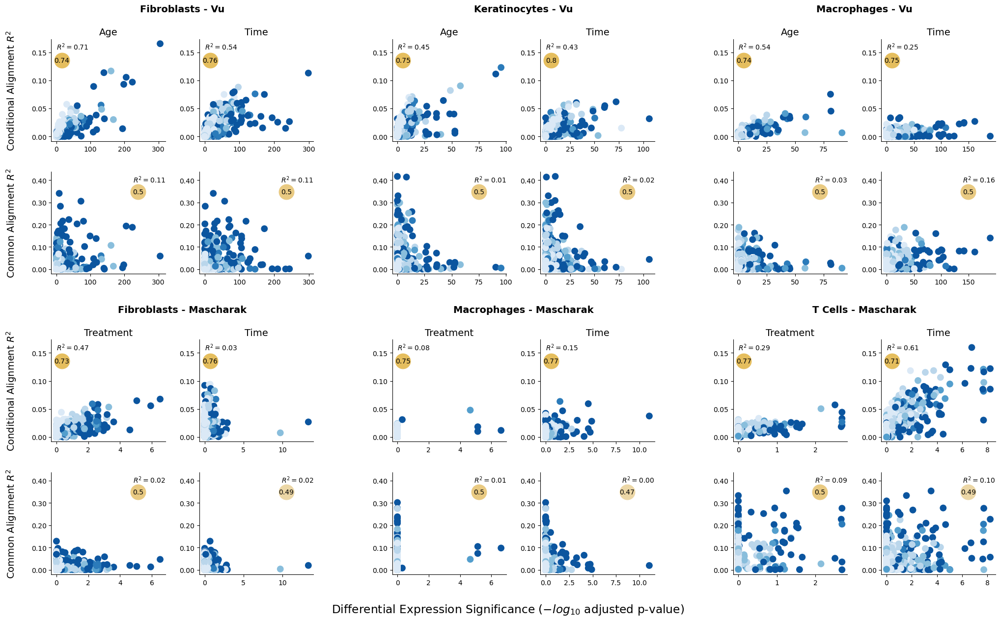

In [221]:
fontsize = 14
figscale = 3
leg_bbox = (0.5, 0.5)
y_offset = 0.03
cmap = matplotlib.colors.ListedColormap(np.array(sns.color_palette('Blues')))
cmap_annot = matplotlib.colors.ListedColormap(np.array(sns.light_palette('#E2B13A', reverse=False)))


# Fig grid
fig = plt.figure(figsize=(21 * 1/2.54 * figscale, 12 * 1/2.54 * figscale))
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.28, wspace=0.3)
ax = [fig.add_subplot(gs[i//3, i%3]) for i in range(6)]

for axs in ax:
    plt.setp(axs.spines.values(), visible=False)
    axs.tick_params(left=False, labelleft=False)
    axs.xaxis.set_visible(False)
    axs.patch.set_visible(False)

# Subfig grids
gs_inner = [gridspec.GridSpecFromSubplotSpec(2,2,ax[i], wspace=0.3, hspace=0.30) for i in range(6)]
ax_inner = [fig.add_subplot(gs_inner[0][0])]
ax_inner.append(fig.add_subplot(gs_inner[0][1], sharey=ax_inner[0]))
ax_inner.append(fig.add_subplot(gs_inner[0][2]))
ax_inner.append(fig.add_subplot(gs_inner[0][3], sharey=ax_inner[2]))


for i in range(4,24):
    if i % 4 in [2,3]:
        ax_inner.append(fig.add_subplot(gs_inner[i//4][i%4], sharey=ax_inner[2])) #= [fig.add_subplot(gs_inner[i//2][i%2]) for i in range(12)]
    
    else:  
        ax_inner.append(fig.add_subplot(gs_inner[i//4][i%4], sharey=ax_inner[0])) #= [fig.add_subplot(gs_inner[i//2][i%2]) for i in range(12)]





#Vu
##Fibroblast
ax[0].set_title('Fibroblasts - Vu', fontsize=fontsize, pad=40, weight='bold')

###Age
ax_inner[0].scatter(r2_de_dict['Vu']['Fibroblast']['Age'][0], r2_de_dict['Vu']['Fibroblast']['Age'][1], s=80, c=r2_de_dict['Vu']['Fibroblast']['Age'][2], cmap=cmap)
ax_inner[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[0].set_title('Age', fontsize=fontsize)
ax_inner[0].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[1].scatter(r2_de_dict['Vu']['Fibroblast']['Time'][0], r2_de_dict['Vu']['Fibroblast']['Time'][1], s=80, c=r2_de_dict['Vu']['Fibroblast']['Time'][2], cmap=cmap)
ax_inner[1].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[1].set_title('Time', fontsize=fontsize)
ax_inner[1].spines[['right', 'top']].set_visible(False)


###Common - Age
ax_inner[2].scatter(r2_de_dict['Vu']['Fibroblast']['Common vs Age'][0], r2_de_dict['Vu']['Fibroblast']['Common vs Age'][1], s=80, c=r2_de_dict['Vu']['Fibroblast']['Common vs Age'][2], cmap=cmap)
ax_inner[2].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[2].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[3].scatter(r2_de_dict['Vu']['Fibroblast']['Common vs Time'][0], r2_de_dict['Vu']['Fibroblast']['Common vs Time'][1], s=80, c=r2_de_dict['Vu']['Fibroblast']['Common vs Time'][2], cmap=cmap)
ax_inner[3].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[3].spines[['right', 'top']].set_visible(False)




##Keratinocyte
ax[1].set_title('Keratinocytes - Vu', fontsize=fontsize, pad=40, weight='bold')

###Age
ax_inner[4].scatter(r2_de_dict['Vu']['Keratinocyte']['Age'][0], r2_de_dict['Vu']['Keratinocyte']['Age'][1], s=80, c=r2_de_dict['Vu']['Keratinocyte']['Age'][2], cmap=cmap)
ax_inner[4].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[4].set_title('Age', fontsize=fontsize)
ax_inner[4].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[5].scatter(r2_de_dict['Vu']['Keratinocyte']['Time'][0], r2_de_dict['Vu']['Keratinocyte']['Time'][1], s=80, c=r2_de_dict['Vu']['Keratinocyte']['Time'][2], cmap=cmap)
ax_inner[5].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[5].set_title('Time', fontsize=fontsize)
ax_inner[5].spines[['right', 'top']].set_visible(False)


###Common - Age
ax_inner[6].scatter(r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][0], r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][1], s=80, c=r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][2], cmap=cmap)
ax_inner[6].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[6].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[7].scatter(r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][0], r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][1], s=80, c=r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][2], cmap=cmap)
ax_inner[7].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[7].spines[['right', 'top']].set_visible(False)





##Macrophage
ax[2].set_title('Macrophages - Vu', fontsize=fontsize, pad=40, weight='bold')

###Age
ax_inner[8].scatter(r2_de_dict['Vu']['Macrophage']['Age'][0], r2_de_dict['Vu']['Macrophage']['Age'][1], s=80, c=r2_de_dict['Vu']['Macrophage']['Age'][2], cmap=cmap)
ax_inner[8].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[8].set_title('Age', fontsize=fontsize)
ax_inner[8].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[9].scatter(r2_de_dict['Vu']['Macrophage']['Time'][0], r2_de_dict['Vu']['Macrophage']['Time'][1], s=80, c=r2_de_dict['Vu']['Macrophage']['Time'][2], cmap=cmap)
ax_inner[9].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[9].set_title('Time', fontsize=fontsize)
ax_inner[9].spines[['right', 'top']].set_visible(False)



###Common - Age
ax_inner[10].scatter(r2_de_dict['Vu']['Macrophage']['Common vs Age'][0], r2_de_dict['Vu']['Macrophage']['Common vs Age'][1], s=80, c=r2_de_dict['Vu']['Macrophage']['Common vs Age'][2], cmap=cmap)
ax_inner[10].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[10].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[11].scatter(r2_de_dict['Vu']['Macrophage']['Common vs Time'][0], r2_de_dict['Vu']['Macrophage']['Common vs Time'][1], s=80, c=r2_de_dict['Vu']['Macrophage']['Common vs Time'][2], cmap=cmap)
ax_inner[11].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[11].spines[['right', 'top']].set_visible(False)





#Mascharak
##Fibroblast
ax[3].set_title('Fibroblasts - Mascharak', fontsize=fontsize, pad=40, weight='bold')

###Treatment
ax_inner[12].scatter(r2_de_dict['Mascharak']['Fibroblast']['Treatment'][0], r2_de_dict['Mascharak']['Fibroblast']['Treatment'][1], s=80, c=r2_de_dict['Mascharak']['Fibroblast']['Treatment'][2], cmap=cmap)
ax_inner[12].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[12].set_title('Treatment', fontsize=fontsize)
ax_inner[12].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[13].scatter(r2_de_dict['Mascharak']['Fibroblast']['Time'][0], r2_de_dict['Mascharak']['Fibroblast']['Time'][1], s=80, c=r2_de_dict['Mascharak']['Fibroblast']['Time'][2], cmap=cmap)
ax_inner[13].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[13].set_title('Time', fontsize=fontsize)
ax_inner[13].spines[['right', 'top']].set_visible(False)



###Common - Age
ax_inner[14].scatter(r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][0], r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][1], s=80, c=r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][2], cmap=cmap)
ax_inner[14].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[14].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[15].scatter(r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][0], r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][1], s=80, c=r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][2], cmap=cmap)
ax_inner[15].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[15].spines[['right', 'top']].set_visible(False)



##Keratinocyte
ax[4].set_title('Macrophages - Mascharak', fontsize=fontsize, pad=40, weight='bold')

###Age
ax_inner[16].scatter(r2_de_dict['Mascharak']['Macrophage']['Treatment'][0], r2_de_dict['Mascharak']['Macrophage']['Treatment'][1], s=80, c=r2_de_dict['Mascharak']['Macrophage']['Treatment'][2], cmap=cmap)
ax_inner[16].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[16].set_title('Treatment', fontsize=fontsize)
ax_inner[16].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[17].scatter(r2_de_dict['Mascharak']['Macrophage']['Time'][0], r2_de_dict['Mascharak']['Macrophage']['Time'][1], s=80, c=r2_de_dict['Mascharak']['Macrophage']['Time'][2], cmap=cmap)
ax_inner[17].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[17].set_title('Time', fontsize=fontsize)
ax_inner[17].spines[['right', 'top']].set_visible(False)


###Common - Age
ax_inner[18].scatter(r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][0], r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][1], s=80, c=r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][2], cmap=cmap)
ax_inner[18].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[18].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[19].scatter(r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][0], r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][1], s=80, c=r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][2], cmap=cmap)
ax_inner[19].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[19].spines[['right', 'top']].set_visible(False)




##Macrophage
ax[5].set_title('T Cells - Mascharak', fontsize=fontsize, pad=40, weight='bold')

###Age
ax_inner[20].scatter(r2_de_dict['Mascharak']['T Cell']['Treatment'][0], r2_de_dict['Mascharak']['T Cell']['Treatment'][1], s=80, c=r2_de_dict['Mascharak']['T Cell']['Treatment'][2], cmap=cmap)
ax_inner[20].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[20].set_title('Treatment', fontsize=fontsize)
ax_inner[20].spines[['right', 'top']].set_visible(False)


###Time
ax_inner[21].scatter(r2_de_dict['Mascharak']['T Cell']['Time'][0], r2_de_dict['Mascharak']['T Cell']['Time'][1], s=80, c=r2_de_dict['Mascharak']['T Cell']['Time'][2], cmap=cmap)
ax_inner[21].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[21].set_title('Time', fontsize=fontsize)
ax_inner[21].spines[['right', 'top']].set_visible(False)


###Common - Age
ax_inner[22].scatter(r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][0], r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][1], s=80, c=r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][2], cmap=cmap)
ax_inner[22].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[22].spines[['right', 'top']].set_visible(False)


###Common - Time
ax_inner[23].scatter(r2_de_dict['Mascharak']['T Cell']['Common vs Time'][0], r2_de_dict['Mascharak']['T Cell']['Common vs Time'][1], s=80, c=r2_de_dict['Mascharak']['T Cell']['Common vs Time'][2], cmap=cmap)
ax_inner[23].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_inner[23].spines[['right', 'top']].set_visible(False)







ms = 22
# Annotations
res = linregress(r2_de_dict['Vu']['Fibroblast']['Age'][0], r2_de_dict['Vu']['Fibroblast']['Age'][1])
ax_inner[0].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[0].get_ylim()[1] - y_offset * ax_inner[0].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[0].plot(ax_inner[0].get_xlim()[1] * 0.05, ax_inner[0].get_ylim()[1] - y_offset * ax_inner[0].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Fibroblast']['Age'][3], 2)), markersize=ms)
ax_inner[0].annotate(np.round(r2_de_dict['Vu']['Fibroblast']['Age'][3], 2), (ax_inner[0].get_xlim()[1] * 0.05, ax_inner[0].get_ylim()[1] - y_offset * ax_inner[0].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Fibroblast']['Time'][0], r2_de_dict['Vu']['Fibroblast']['Time'][1])
ax_inner[1].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[1].get_ylim()[1] - y_offset * ax_inner[1].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[1].plot(ax_inner[1].get_xlim()[1] * 0.05, ax_inner[1].get_ylim()[1] - y_offset * ax_inner[1].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Fibroblast']['Time'][3], 2)), markersize=ms)
ax_inner[1].annotate(np.round(r2_de_dict['Vu']['Fibroblast']['Time'][3], 2), (ax_inner[1].get_xlim()[1] * 0.05, ax_inner[1].get_ylim()[1] - y_offset * ax_inner[1].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Fibroblast']['Common vs Age'][0], r2_de_dict['Vu']['Fibroblast']['Common vs Age'][1])
ax_inner[2].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[2].get_xlim()[1], ax_inner[2].get_ylim()[1] - y_offset * ax_inner[2].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[2].plot(ax_inner[2].get_xlim()[1] * 0.75, ax_inner[2].get_ylim()[1] - y_offset * ax_inner[2].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Fibroblast']['Common vs Age'][3], 2)), markersize=ms)
ax_inner[2].annotate(np.round(r2_de_dict['Vu']['Fibroblast']['Common vs Age'][3], 2), (ax_inner[2].get_xlim()[1] * 0.75, ax_inner[2].get_ylim()[1] - y_offset * ax_inner[2].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Fibroblast']['Common vs Time'][0], r2_de_dict['Vu']['Fibroblast']['Common vs Time'][1])
ax_inner[3].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[3].get_xlim()[1], ax_inner[3].get_ylim()[1] - y_offset * ax_inner[3].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[3].plot(ax_inner[3].get_xlim()[1] * 0.75, ax_inner[3].get_ylim()[1] - y_offset * ax_inner[3].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Fibroblast']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[3].annotate(np.round(r2_de_dict['Vu']['Fibroblast']['Common vs Time'][3], 2), (ax_inner[3].get_xlim()[1] * 0.75, ax_inner[3].get_ylim()[1] - y_offset * ax_inner[3].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Keratinocyte']['Age'][0], r2_de_dict['Vu']['Keratinocyte']['Age'][1])
ax_inner[4].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[4].get_ylim()[1] - y_offset * ax_inner[4].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[4].plot(ax_inner[4].get_xlim()[1] * 0.05, ax_inner[4].get_ylim()[1] - y_offset * ax_inner[4].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Keratinocyte']['Age'][3], 2)), markersize=ms)
ax_inner[4].annotate(np.round(r2_de_dict['Vu']['Keratinocyte']['Age'][3], 2), (ax_inner[4].get_xlim()[1] * 0.05, ax_inner[4].get_ylim()[1] - y_offset * ax_inner[4].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Keratinocyte']['Time'][0], r2_de_dict['Vu']['Keratinocyte']['Time'][1])
ax_inner[5].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[5].get_ylim()[1] - y_offset * ax_inner[5].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[5].plot(ax_inner[5].get_xlim()[1] * 0.05, ax_inner[5].get_ylim()[1] - y_offset * ax_inner[5].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Keratinocyte']['Time'][3], 2)), markersize=ms)
ax_inner[5].annotate(np.round(r2_de_dict['Vu']['Keratinocyte']['Time'][3], 2), (ax_inner[5].get_xlim()[1] * 0.05, ax_inner[5].get_ylim()[1] - y_offset * ax_inner[5].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][0], r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][1])
ax_inner[6].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[6].get_xlim()[1], ax_inner[6].get_ylim()[1] - y_offset * ax_inner[6].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[6].plot(ax_inner[6].get_xlim()[1] * 0.75, ax_inner[6].get_ylim()[1] - y_offset * ax_inner[6].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][3], 2)), markersize=ms)
ax_inner[6].annotate(np.round(r2_de_dict['Vu']['Keratinocyte']['Common vs Age'][3], 2), (ax_inner[6].get_xlim()[1] * 0.75, ax_inner[6].get_ylim()[1] - y_offset * ax_inner[6].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][0], r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][1])
ax_inner[7].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[7].get_xlim()[1], ax_inner[7].get_ylim()[1] - y_offset * ax_inner[7].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[7].plot(ax_inner[7].get_xlim()[1] * 0.75, ax_inner[7].get_ylim()[1] - y_offset * ax_inner[7].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[7].annotate(np.round(r2_de_dict['Vu']['Keratinocyte']['Common vs Time'][3], 2), (ax_inner[7].get_xlim()[1] * 0.75, ax_inner[7].get_ylim()[1] - y_offset * ax_inner[7].get_ylim()[1] * 6.8), ha='center', va='center')


res = linregress(r2_de_dict['Vu']['Macrophage']['Age'][0], r2_de_dict['Vu']['Macrophage']['Age'][1])
ax_inner[8].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[8].get_ylim()[1] - y_offset * ax_inner[8].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[8].plot(ax_inner[8].get_xlim()[1] * 0.05, ax_inner[8].get_ylim()[1] - y_offset * ax_inner[8].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Macrophage']['Age'][3], 2)), markersize=ms)
ax_inner[8].annotate(np.round(r2_de_dict['Vu']['Macrophage']['Age'][3], 2), (ax_inner[8].get_xlim()[1] * 0.05, ax_inner[8].get_ylim()[1] - y_offset * ax_inner[8].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Macrophage']['Time'][0], r2_de_dict['Vu']['Macrophage']['Time'][1])
ax_inner[9].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[9].get_ylim()[1] - y_offset * ax_inner[9].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[9].plot(ax_inner[9].get_xlim()[1] * 0.05, ax_inner[9].get_ylim()[1] - y_offset * ax_inner[9].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Macrophage']['Time'][3], 2)), markersize=ms)
ax_inner[9].annotate(np.round(r2_de_dict['Vu']['Macrophage']['Time'][3], 2), (ax_inner[9].get_xlim()[1] * 0.05, ax_inner[9].get_ylim()[1] - y_offset * ax_inner[9].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Macrophage']['Common vs Age'][0], r2_de_dict['Vu']['Macrophage']['Common vs Age'][1])
ax_inner[10].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[10].get_xlim()[1], ax_inner[10].get_ylim()[1] - y_offset * ax_inner[10].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[10].plot(ax_inner[10].get_xlim()[1] * 0.75, ax_inner[10].get_ylim()[1] - y_offset * ax_inner[10].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Macrophage']['Common vs Age'][3], 2)), markersize=ms)
ax_inner[10].annotate(np.round(r2_de_dict['Vu']['Macrophage']['Common vs Age'][3], 2), (ax_inner[10].get_xlim()[1] * 0.75, ax_inner[10].get_ylim()[1] - y_offset * ax_inner[10].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Vu']['Macrophage']['Common vs Time'][0], r2_de_dict['Vu']['Macrophage']['Common vs Time'][1])
ax_inner[11].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[11].get_xlim()[1], ax_inner[11].get_ylim()[1] - y_offset * ax_inner[11].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[11].plot(ax_inner[11].get_xlim()[1] * 0.75, ax_inner[11].get_ylim()[1] - y_offset * ax_inner[11].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Vu']['Macrophage']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[11].annotate(np.round(r2_de_dict['Vu']['Macrophage']['Common vs Time'][3], 2), (ax_inner[11].get_xlim()[1] * 0.75, ax_inner[11].get_ylim()[1] - y_offset * ax_inner[11].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Fibroblast']['Treatment'][0], r2_de_dict['Mascharak']['Fibroblast']['Treatment'][1])
ax_inner[12].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[12].get_ylim()[1] - y_offset * ax_inner[12].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[12].plot(ax_inner[12].get_xlim()[1] * 0.05, ax_inner[12].get_ylim()[1] - y_offset * ax_inner[12].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Fibroblast']['Treatment'][3], 2)), markersize=ms)
ax_inner[12].annotate(np.round(r2_de_dict['Mascharak']['Fibroblast']['Treatment'][3], 2), (ax_inner[12].get_xlim()[1] * 0.05, ax_inner[12].get_ylim()[1] - y_offset * ax_inner[12].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Fibroblast']['Time'][0], r2_de_dict['Mascharak']['Fibroblast']['Time'][1])
ax_inner[13].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[13].get_ylim()[1] - y_offset * ax_inner[13].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[13].plot(ax_inner[13].get_xlim()[1] * 0.05, ax_inner[13].get_ylim()[1] - y_offset * ax_inner[13].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Fibroblast']['Time'][3], 2)), markersize=ms)
ax_inner[13].annotate(np.round(r2_de_dict['Mascharak']['Fibroblast']['Time'][3], 2), (ax_inner[13].get_xlim()[1] * 0.05, ax_inner[13].get_ylim()[1] - y_offset * ax_inner[13].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][0], r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][1])
ax_inner[14].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[14].get_xlim()[1], ax_inner[14].get_ylim()[1] - y_offset * ax_inner[14].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[14].plot(ax_inner[14].get_xlim()[1] * 0.75, ax_inner[14].get_ylim()[1] - y_offset * ax_inner[14].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][3], 2)), markersize=ms)
ax_inner[14].annotate(np.round(r2_de_dict['Mascharak']['Fibroblast']['Common vs Treatment'][3], 2), (ax_inner[14].get_xlim()[1] * 0.75, ax_inner[14].get_ylim()[1] - y_offset * ax_inner[14].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][0], r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][1])
ax_inner[15].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[15].get_xlim()[1], ax_inner[15].get_ylim()[1] - y_offset * ax_inner[15].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[15].plot(ax_inner[15].get_xlim()[1] * 0.75, ax_inner[15].get_ylim()[1] - y_offset * ax_inner[15].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[15].annotate(np.round(r2_de_dict['Mascharak']['Fibroblast']['Common vs Time'][3], 2), (ax_inner[15].get_xlim()[1] * 0.75, ax_inner[15].get_ylim()[1] - y_offset * ax_inner[15].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Macrophage']['Treatment'][0], r2_de_dict['Mascharak']['Macrophage']['Treatment'][1])
ax_inner[16].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[16].get_ylim()[1] - y_offset * ax_inner[16].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[16].plot(ax_inner[16].get_xlim()[1] * 0.05, ax_inner[16].get_ylim()[1] - y_offset * ax_inner[16].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Macrophage']['Treatment'][3], 2)), markersize=ms)
ax_inner[16].annotate(np.round(r2_de_dict['Mascharak']['Macrophage']['Treatment'][3], 2), (ax_inner[16].get_xlim()[1] * 0.05, ax_inner[16].get_ylim()[1] - y_offset * ax_inner[16].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Macrophage']['Time'][0], r2_de_dict['Mascharak']['Macrophage']['Time'][1])
ax_inner[17].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[17].get_ylim()[1] - y_offset * ax_inner[17].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[17].plot(ax_inner[17].get_xlim()[1] * 0.05, ax_inner[17].get_ylim()[1] - y_offset * ax_inner[17].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Macrophage']['Time'][3], 2)), markersize=ms)
ax_inner[17].annotate(np.round(r2_de_dict['Mascharak']['Macrophage']['Time'][3], 2), (ax_inner[17].get_xlim()[1] * 0.05, ax_inner[17].get_ylim()[1] - y_offset * ax_inner[17].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][0], r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][1])
ax_inner[18].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[18].get_xlim()[1], ax_inner[18].get_ylim()[1] - y_offset * ax_inner[18].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[18].plot(ax_inner[18].get_xlim()[1] * 0.75, ax_inner[18].get_ylim()[1] - y_offset * ax_inner[18].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][3], 2)), markersize=ms)
ax_inner[18].annotate(np.round(r2_de_dict['Mascharak']['Macrophage']['Common vs Treatment'][3], 2), (ax_inner[18].get_xlim()[1] * 0.75, ax_inner[18].get_ylim()[1] - y_offset * ax_inner[18].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][0], r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][1])
ax_inner[19].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[19].get_xlim()[1], ax_inner[19].get_ylim()[1] - y_offset * ax_inner[19].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[19].plot(ax_inner[19].get_xlim()[1] * 0.75, ax_inner[19].get_ylim()[1] - y_offset * ax_inner[19].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[19].annotate(np.round(r2_de_dict['Mascharak']['Macrophage']['Common vs Time'][3], 2), (ax_inner[19].get_xlim()[1] * 0.75, ax_inner[19].get_ylim()[1] - y_offset * ax_inner[19].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['T Cell']['Treatment'][0], r2_de_dict['Mascharak']['T Cell']['Treatment'][1])
ax_inner[20].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[20].get_ylim()[1] - y_offset * ax_inner[20].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[20].plot(ax_inner[20].get_xlim()[1] * 0.05, ax_inner[20].get_ylim()[1] - y_offset * ax_inner[20].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['T Cell']['Treatment'][3], 2)), markersize=ms)
ax_inner[20].annotate(np.round(r2_de_dict['Mascharak']['T Cell']['Treatment'][3], 2), (ax_inner[20].get_xlim()[1] * 0.05, ax_inner[20].get_ylim()[1] - y_offset * ax_inner[20].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['T Cell']['Time'][0], r2_de_dict['Mascharak']['T Cell']['Time'][1])
ax_inner[21].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(0,ax_inner[21].get_ylim()[1] - y_offset * ax_inner[21].get_ylim()[1]), horizontalalignment='left', verticalalignment='top')
ax_inner[21].plot(ax_inner[21].get_xlim()[1] * 0.05, ax_inner[21].get_ylim()[1] - y_offset * ax_inner[21].get_ylim()[1] * 7.3, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['T Cell']['Time'][3], 2)), markersize=ms)
ax_inner[21].annotate(np.round(r2_de_dict['Mascharak']['T Cell']['Time'][3], 2), (ax_inner[21].get_xlim()[1] * 0.05, ax_inner[21].get_ylim()[1] - y_offset * ax_inner[21].get_ylim()[1] * 7.3), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][0], r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][1])
ax_inner[22].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[22].get_xlim()[1], ax_inner[22].get_ylim()[1] - y_offset * ax_inner[22].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[22].plot(ax_inner[22].get_xlim()[1] * 0.75, ax_inner[22].get_ylim()[1] - y_offset * ax_inner[22].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][3], 2)), markersize=ms)
ax_inner[22].annotate(np.round(r2_de_dict['Mascharak']['T Cell']['Common vs Treatment'][3], 2), (ax_inner[22].get_xlim()[1] * 0.75, ax_inner[22].get_ylim()[1] - y_offset * ax_inner[22].get_ylim()[1] * 6.8), ha='center', va='center')

res = linregress(r2_de_dict['Mascharak']['T Cell']['Common vs Time'][0], r2_de_dict['Mascharak']['T Cell']['Common vs Time'][1])
ax_inner[23].annotate('$R^2 = {:.2f}$'.format(res.rvalue**2), xy=(ax_inner[23].get_xlim()[1], ax_inner[23].get_ylim()[1] - y_offset * ax_inner[23].get_ylim()[1]), horizontalalignment='right', verticalalignment='top')
ax_inner[23].plot(ax_inner[23].get_xlim()[1] * 0.75, ax_inner[23].get_ylim()[1] - y_offset * ax_inner[23].get_ylim()[1] * 6.8, marker='o', color=cmap_annot(np.round(r2_de_dict['Mascharak']['T Cell']['Common vs Time'][3], 2)), markersize=ms)
ax_inner[23].annotate(np.round(r2_de_dict['Mascharak']['T Cell']['Common vs Time'][3], 2), (ax_inner[23].get_xlim()[1] * 0.75, ax_inner[23].get_ylim()[1] - y_offset * ax_inner[23].get_ylim()[1] * 6.8), ha='center', va='center')


ax_inner[0].set_ylabel("Conditional Alignment $R^2$", fontsize=fontsize*1, labelpad=20)
ax_inner[2].set_ylabel("Common Alignment $R^2$", fontsize=fontsize*1, labelpad=20)

ax_inner[12].set_ylabel("Conditional Alignment $R^2$", fontsize=fontsize*1, labelpad=20)
ax_inner[14].set_ylabel("Common Alignment $R^2$", fontsize=fontsize*1, labelpad=20)

fig.supxlabel("Differential Expression Significance ($-log_{10}$ adjusted p-value)", y=0.05, fontsize=fontsize * 1.2)



plt.savefig('plots/final/fig_6_condalign.png', dpi=300, bbox_inches='tight')
plt.show()

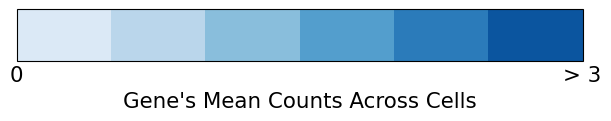

In [8]:
fig, ax = plt.subplots(figsize=(6, 1.1), layout='constrained')

norm = matplotlib.colors.Normalize(vmin=0, vmax=3)

fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=ax, orientation='horizontal')



ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([0, None, None, None, None, None, '> 3'], fontsize=fontsize*1.1)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.set_xlabel("Gene's Mean Counts Across Cells", fontsize=fontsize*1.1)

plt.savefig('plots/final/fig_6_condalign_cbar.png', dpi=300, bbox_inches='tight')
plt.show()

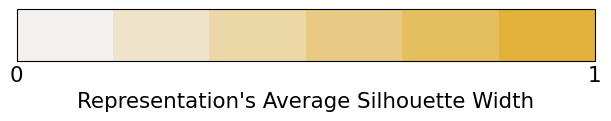

In [9]:
fig, ax = plt.subplots(figsize=(6, 1.1), layout='constrained')

norm = matplotlib.colors.Normalize(vmin=0, vmax=1)

fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap_annot),
             cax=ax, orientation='horizontal')



ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([0, None, None, None, None, 1], fontsize=fontsize*1.1)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.set_xlabel("Representation's Average Silhouette Width", fontsize=fontsize*1.1)

plt.savefig('plots/final/fig_6_condalign_cbar_sep.png', dpi=300, bbox_inches='tight')
plt.show()

# Latent Bipartite

## Table

In [2]:
get_data("Vu")
get_data("Mascharak")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 292M/292M [00:02<00:00, 112MB/s]


Object saved at ./data/vu_2022_ay_wh.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36.0M/36.0M [00:00<00:00, 108MB/s]

Object saved at ./data/mascharak_2022_tn_wh.h5ad


In [10]:
sankey_dict = {
    'Vu': {
        'Fibroblast': None,
        'Keratinocyte': None,
        'Macrophage': None,
    },
    'Mascharak': {
        'Fibroblast': None,
        'Macrophage': None,
        'T Cell': None,
    },
}


names_dict = {
    'vu' : 'Vu',
    'mascharak' : 'Mascharak',
    'fibroblast' : 'Fibroblast',
    'macrophage' : 'Macrophage',
    'keratinocyte' : 'Keratinocyte', 
    'tcell' : 'T Cell',
    'treatment' : 'Treatment',
    'time' : 'Time',
    'age' : 'Age',
}


ontologies = {
    'Vu' : {
        'Fibroblast' : [
            'Positive Regulation Of Angiogenesis',
            'Positive Regulation Of Cell Population Proliferation',
            'Inflammatory Response',
            'Extracellular Matrix Organization',
            'Cytokine-Mediated Signaling Pathway',
            'Extracellular Structure Organization',
            'Positive Regulation Of Fibroblast Proliferation',
            'External Encapsulating Structure Organization',
            'Positive Regulation Of Wound Healing',
            'Skin Development',
        ],

        'Keratinocyte' : [
            'Intermediate Filament Organization',
            'Supramolecular Fiber Organization',
            'Keratinocyte Differentiation',
            'Epidermal Cell Differentiation',
            'Establishment Of Skin Barrier',
            'Skin Epidermis Development',
            'Negative Regulation Of Wnt Signaling Pathway',
            'Negative Regulation Of Cell Migration',
            'Long-Chain Fatty Acid Transport',
            'Negative Regulation Of Cell Motility',
            
        ],
        
    },

    'Mascharak' : {
        'Fibroblast' : [
            'Positive Regulation Of Cell Population Proliferation',
            'Positive Regulation Of Cell Motility',
            'Regulation Of Bone Mineralization',
            'Epidermis Development',
            'Regulation Of Osteoblast Differentiation',
            'Extracellular Matrix Organization',
            'External Encapsulating Structure Organization',
            'Inflammatory Response',
            'Muscle Tissue Morphogenesis',
            'Regulation Of Angiogenesis',
        ],

        'T Cell' : [
            'Cellular Response To Molecule Of Bacterial Origin',
            'Regulation Of Interleukin-4 Production',
            'Cellular Response To Oxygen-Containing Compound',
            'Positive Regulation Of Epithelial To Mesenchymal Transition',
            'Regulation Of B Cell Proliferation',
            'Positive Regulation Of Cellular Component Organization',
            'Positive Regulation Of Interleukin-4 Production',
            'Positive Regulation Of Cytokine Production',
            'Myeloid Leukocyte Differentiation',
            'Negative Regulation Of T Cell Activation',
        ]
        
        
    },
}



for dataset in ['vu', 'mascharak']:
    
    match dataset:
        case 'vu':
            ctypes = ['fibroblast', 'keratinocyte']
            factors = ["time", "age"]
            batch_key = 'sample'

        case 'mascharak':
            ctypes = ['fibroblast', 'tcell']
            factors = ["time", "treatment"]
            batch_key = None


    for ctype in ctypes:
        print(f'Subset : {names_dict[ctype]}')

        match dataset:
            case 'vu':
                anndata = ad.read_h5ad("data/vu_2022_ay_wh.h5ad")

            case 'mascharak':
                anndata = ad.read_h5ad("data/mascharak_2022_tn_wh.h5ad")

                
        anndata.layers["normalized"] = deepcopy(anndata.X)

        # Subset
        anndata = anndata[anndata.obs['broad_type'] == names_dict[ctype]]
        
        # Find/subset HVGs & swap to raw counts
        sc.pp.highly_variable_genes(anndata, n_top_genes=3000, batch_key=batch_key)        
        anndata = anndata[:, anndata.var["highly_variable"]]
        anndata.X = anndata.layers["counts"]
                
                        
        workflow = InterpretableWorkflow(anndata[anndata.obs['broad_type'] == names_dict[ctype]], verbose=True, random_seed=42)
        workflow.prep_model(factors, batch_key=batch_key, cell_type_label_key="broad_type", model_type='Patches')
        workflow.load_model(f'params/{dataset}_ld_{names_dict[ctype]}')
        workflow.get_conditional_loadings()


        score_dict, levels = {}, []

        for factor in workflow.factors:
            for level in workflow.anndata.obs[factor].cat.categories:
                
                scores = workflow.anndata.var[f'{level}_score_Patches'].sort_values(ascending=False)[:300] #workflow.anndata.var[f'{level}_score_Patches'].sort_values(ascending=False)[:300]
                
                for i in range(len(scores)):
            
                    if scores.index[i] not in score_dict.keys():
                        score_dict[scores.index[i]] = {}
            
                    score_dict[scores.index[i]][level] = scores[i]

                levels.append(level)


        labels = list(score_dict.keys())

        # Filter for GO

        df = gp.enrichr(gene_list=labels[:-5],
                 gene_sets=['GO_Biological_Process_2023'],
                 organism='Mouse', 
                 outdir=None,
        ).results
        
        df = df[df['Adjusted P-value'] < 0.05]
        df['Term'] = df['Term'].apply(lambda x : x[:x.find('(')-1])
        df['Hits'] = df['Overlap'].apply(lambda x : int(x[:x.find('/')]))
        df = df[df['Term'].isin(ontologies[names_dict[dataset]][names_dict[ctype]])].reindex()

        labels_filt = []
        
        for label in labels:
            for idx,row in df.iterrows():    
                if label.upper() in row['Genes'].split(';') :
                    labels_filt.append(label)
                    break
                    

        # Get sankey dict
        sources, targets, values = [], [], []

        labels_filt_full = labels_filt + levels
        
        for key in labels_filt:
            for sub_key in sorted(list(score_dict[key].keys())):
                sources.append(labels_filt_full.index(sub_key))
                targets.append(labels_filt_full.index(key))
                values.append(np.round(score_dict[key][sub_key], 3))



        sankey_dict[names_dict[dataset]][names_dict[ctype]] = [labels_filt_full, sources, targets, values, df, score_dict]

Subset : Fibroblast


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning:

Trying to modify attribute `._uns` of view, initializing view as actual.

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



Initialized workflow to run interpretable model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.


/tmp/ipykernel_2393107/1588734236.py:146: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Subset : Keratinocyte


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning:

Trying to modify attribute `._uns` of view, initializing view as actual.

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



Initialized workflow to run interpretable model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.


/tmp/ipykernel_2393107/1588734236.py:146: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Subset : Fibroblast


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning:

Trying to modify attribute `._uns` of view, initializing view as actual.

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/tmp/ipykernel_2393107/1588734236.py:146: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Initialized workflow to run interpretable model.

Condition classes : ['time', 'treatment']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB_LD', 'batch_correction': False, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.
Subset : T Cell


/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning:

Trying to modify attribute `._uns` of view, initializing view as actual.

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



Initialized workflow to run interpretable model.

Condition classes : ['time', 'treatment']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'reconstruction': 'ZINB_LD', 'batch_correction': False, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.


/tmp/ipykernel_2393107/1588734236.py:146: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



## Plot

In [11]:
import plotly.graph_objects as go
import plotly.io as pio


cell_colors = {
 'Endothelial' : "#8B1E3F",  # Deep Burgundy
 'Fibroblast' : "#3B5998",  # Rich Blue
 'Gamma-delta T Cell' : "#6A994E",  # Fresh Olive Green
 'Granulocyte' : "#264653",  # Deep Teal
 'Keratinocyte' : "#E9C46A",  # Soft Yellow
 'Macrophage' : "#F4A261",  # Warm Orange
 'Melanocyte' : "#E76F51",  # Burnt Sienna
 'Neutrophil' : "#FFC8A2",  # Soft Peach
 'Pericyte' : "#D3D9E3",  # Soft Pastel Blue
 'Red Blood Cell' : "#BC4749", # Warm Cranberry Red
 'Skeletal Muscle' : "#A8DADC", # Pale Turquoise
 'T Cell' : "#2A9D8F", # Muted Green
}

level_colors = {
    '0DPW': "#7DC9BF",  # Slightly brightened for better readability.
    '4DPW': "#E39F02",  # Adjusted for stronger contrast.
    '7DPW': "#ADA3CE",  # Lightened for better readability.
    'POD7': "#ADA3CD",  # Same as '7DPW' since they share a color.
    'POD14': "#72A7C8", # Enhanced brightness and contrast.
    'POD30': "#FCA853", # Slightly brightened for legibility.
    'PBS-treated': "#43A543", # Enhanced green contrast.
    'Verteporfin-treated': "#8C439C", # Adjusted purple for better text contrast.
    'Aged': "#D11C24",  # Improved red contrast without losing intensity.
    'Young': "#2F6EBE"  # Adjusted blue for sharper readability.
}




labels, sources, targets, values, df, score_dict = deepcopy(sankey_dict['Vu']['Keratinocyte'])

color_len = len(sources)

labels = labels + list(df['Term'])
labels_genes, labels_rest = labels[:-15], labels[-15:]

cmap = matplotlib.colors.ListedColormap(['#164F73', '#D99E32', '#D96F32', '#D9583B', '#8BAAA9', '#E0D8B0', '#BDCBD8', '#B6A345', '#AB7567', '#AD8B9F']) #matplotlib.colors.ListedColormap(sns.color_palette("tab10"))
ontology_colors = {df['Term'].iloc[i] : f'rgba{tuple(list(cmap(i)[:3]) + [0.2])}' for i in range(10)}


# Set node pos
node_pos_x, node_pos_y = [], []

for i in range(len(labels)):
    if i < len(labels)-15:
        node_pos_x.append(1/2)
        node_pos_y.append((i+1e-6)/len(labels[:-15]))
    
    elif len(labels)-15 <= i < len(labels)-10:
        node_pos_x.append(1e-6)
        node_pos_y.append(((i+1e-6) -len(labels)+15)/5)

    else:
        node_pos_x.append(1-1e-6)
        node_pos_y.append((((i+1e-6)-len(labels)+10))/10)



    

col_list_links = []
col_list_nodes = [ontology_colors[elem] for elem in labels[-10:]]
# Update source/targets with go information
for label in labels_genes:        
    for idx,row in df.iterrows():    
        if label.upper() in row['Genes'].split(';') :
            sources.append(labels.index(label))
            targets.append(labels.index(row['Term']))
            values.append(1)
            col_list_links.append(ontology_colors[row['Term']])


labels = labels_genes + labels_rest
labels_cens = (['']*(len(labels)-15)) + labels[-15:]


col_list_genes = []
for label in labels_genes:
    max_idx, max_val = '', 0

    for key in score_dict[label]:
        if score_dict[label][key] > max_val:
            max_idx, max_val = key, score_dict[label][key]

    col_list_genes.append(level_colors[max_idx])
    

# Reorganize y labels - factors
reorg_labels = {}
i=0
while i < len(labels)-15:
    for level in list(level_colors.keys()):
        sub_list = []
        col = level_colors[level]
        
        for j in range(len(labels[:-15])):
            if col_list_genes[j] == col:
                sub_list.append(labels[:-15][j])
                node_pos_y[j] = (i+1e-6)/len(labels[:-15])
                i += 1      


        reorg_labels[level] = sub_list


reorg_labels_inv = {elem : k for k,v in reorg_labels.items() for elem in v}
fact_genes = {l1 : {l2 : 0 for l2 in labels[-15:-10]} for l1 in labels[-15:-10]}
fact_onts = {l1 : {l2 : 0 for l2 in labels[-10:]} for l1 in labels[-15:-10]}



# Group genes by factor
flow_scale = 1
for fact in reorg_labels.keys():
    for i in range(len(sources)):
        try:
            if labels[sources[i]] == fact:
                fact_genes[fact][reorg_labels_inv[labels[targets[i]]]] += values[i] * flow_scale

        except KeyError:
            pass    

# Group genes by ontology
for i in range(len(sources)):
    try:
        fact_onts[reorg_labels_inv[labels[sources[i]]]][labels[targets[i]]] += 1 * flow_scale

    except KeyError:
        pass


# Match in out flows proportionally
for key in fact_genes.keys():
    inc_flow = sum([fact_genes[inc][key] for inc in fact_genes.keys()])
    out_flow = sum([fact_onts[key][out] for out in fact_onts[key].keys()])
    flow_norm = inc_flow / out_flow
    fact_onts[key] = {k : v*flow_norm for k,v in fact_onts[key].items()}


labels_grouped = labels[-15:-10] + labels[-15:]
nodes_x_grouped, nodes_y_grouped, sources_grouped, targets_grouped, values_grouped = [],[],[],[],[]

# Node positions
for i in range(len(labels_grouped)):
    if i < 5:
        nodes_x_grouped.append(1-1e-6)
        nodes_y_grouped.append((i+1e-6)/5)
    
    elif 5 <= i < 10:
        nodes_x_grouped.append(1/2)
        nodes_y_grouped.append(((i+1e-6)-5)/5)

    else:
        nodes_x_grouped.append(1e-6)
        nodes_y_grouped.append(((i+1e-6)-10)/10)


# Add 1st section
for key in fact_genes:
    for sub_key in fact_genes[key]:
        sources_grouped.append(labels_grouped.index(key))
        targets_grouped.append(labels_grouped.index(sub_key,5))
        values_grouped.append(fact_genes[key][sub_key])

# Add 2nd section
for key in fact_onts:
    for sub_key in fact_onts[key]:
        sources_grouped.append(labels_grouped.index(key,5))
        targets_grouped.append(labels_grouped.index(sub_key))
        values_grouped.append(fact_onts[key][sub_key])

### Ungrouped

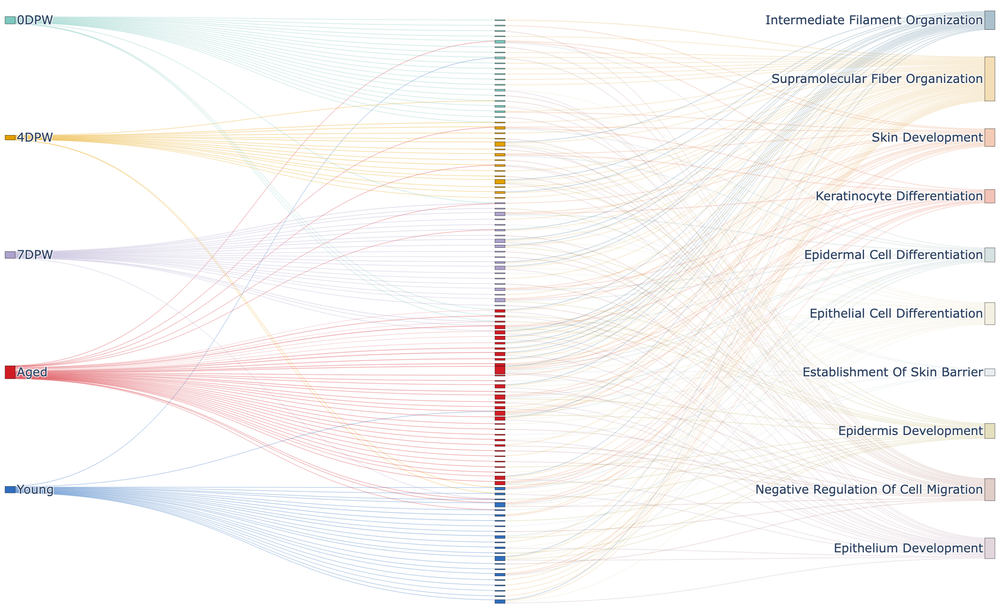

In [203]:
scale=2


fig = go.Figure(data=[go.Sankey(
    arrangement='fixed',
    node = dict(
      pad = 15 * scale,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels_cens,
      color = col_list_genes + [level_colors[elem] for elem in labels[-15:-10]] + col_list_nodes,
      x=node_pos_x,
      y=node_pos_y,
    ),
    
    link = dict(
      source = targets,
      target = sources,
      value = values,
      color = [
            f"rgba({int(level_colors[labels[elem]][1:3], 16)},"
            f"{int(level_colors[labels[elem]][3:5], 16)},"
            f"{int(level_colors[labels[elem]][5:7], 16)}, 0.2)"
            for elem in sources[:color_len]
        ] + col_list_links, 
        
        
  ))]
)


config = {
  'toImageButtonOptions': {
    'format': 'png',
    'filename': 'fig.png',
    'height': 600*scale,
    'width': 1000*scale,
    'scale': 2 # Multiply title/legend/axis/canvas sizes by this factor
  }
}

fig.update_layout(title_text=f"", font_size=12*scale, autosize=False, width=1000*scale, height=600*scale, margin=dict(l=20, r=20, t=40, b=0))
fig.write_image('plots/final/fig_6_keratinocytes.png', scale=4, width=1000*scale, height=600*scale)
fig.show(config=config)

In [70]:
# Convert to HTML and make the section scrollable
from IPython.core.display import HTML
html_content = fig.to_html(full_html=False)

scrollable_div = f"""
    <div style="width: 100%; overflow-x: scroll;">
        {html_content}
    </div>
    """

HTML(scrollable_div)

### Grouped

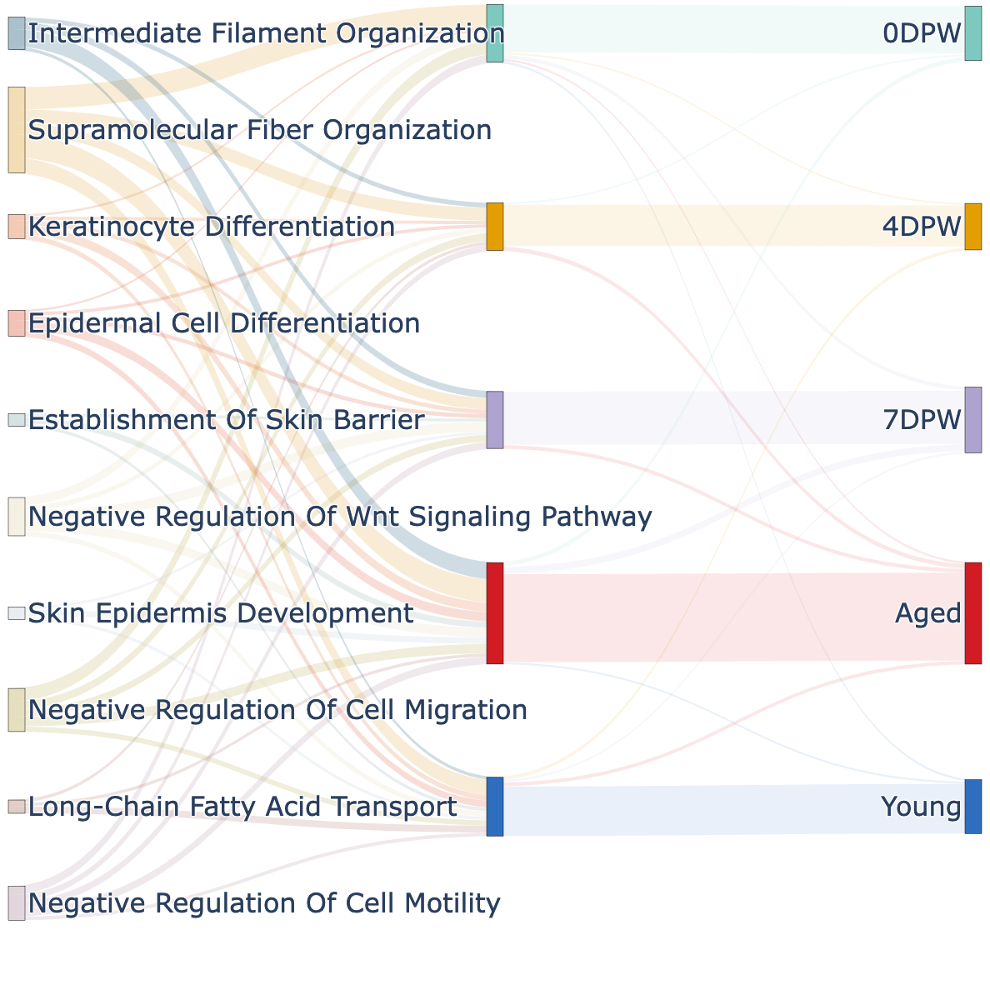

In [12]:
scale=2


fig = go.Figure(
    data=[go.Sankey(
    arrangement='fixed',
    node = dict(
      pad = 60 * scale,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels_grouped[:5] + (['']*5) + labels_grouped[10:],
      color = [level_colors[elem] for elem in labels_grouped[:10]] + col_list_nodes,
      x=nodes_x_grouped,
      y=nodes_y_grouped,
    ),
    
    link = dict(
      source = sources_grouped,
      target = targets_grouped,
      value = values_grouped,
      color = [
            f"rgba({int(level_colors[labels_grouped[elem]][1:3], 16)},"
            f"{int(level_colors[labels_grouped[elem]][3:5], 16)},"
            f"{int(level_colors[labels_grouped[elem]][5:7], 16)}, 0.1)"
            for elem in sources_grouped[:25] 
        ] + [ontology_colors[labels_grouped[elem]] for elem in targets_grouped[25:]], 
        
        
  ))]
)


config = {
  'toImageButtonOptions': {
    'format': 'png',
    'filename': 'fig.png',
    'height': 600*scale,
    'width': 1000*scale,
    'scale': 2 # Multiply title/legend/axis/canvas sizes by this factor
  }
}


fig.update_layout(title_text=f"", font_size=16*scale, autosize=False, width=1000*scale, height=600*scale, margin=dict(l=20, r=20, t=40, b=0))
fig.write_image('plots/final/fig_6_keratinocytes.png', scale=4, width=1000*scale, height=600*scale)
fig.show(config=config)

In [172]:
# Convert to HTML and make the section scrollable
from IPython.core.display import HTML
html_content = fig.to_html(full_html=False)

scrollable_div = f"""
    <div style="width: 100%; overflow-x: scroll;">
        {html_content}
    </div>
    """

HTML(scrollable_div)

# Robustness - Venn

In [2]:
"""
All credit from the implementation below goes to https://github.com/tctianchi/pyvenn

Added a way to pass subaxes.
"""


# coding: utf-8
from itertools import chain
try:
    # since python 3.10
    from collections.abc import Iterable
except ImportError:
    from collections import Iterable
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors
import math

default_colors = [
    # r, g, b, a
    [92, 192, 98, 0.5],
    [90, 155, 212, 0.5],
    [246, 236, 86, 0.6],
    [241, 90, 96, 0.4],
    [255, 117, 0, 0.3],
    [82, 82, 190, 0.2],
]
default_colors = [
    [i[0] / 255.0, i[1] / 255.0, i[2] / 255.0, i[3]]
    for i in default_colors
]

def draw_ellipse(fig, ax, x, y, w, h, a, fillcolor):
    e = patches.Ellipse(
        xy=(x, y),
        width=w,
        height=h,
        angle=a,
        color=fillcolor)
    ax.add_patch(e)

def draw_triangle(fig, ax, x1, y1, x2, y2, x3, y3, fillcolor):
    xy = [
        (x1, y1),
        (x2, y2),
        (x3, y3),
    ]
    polygon = patches.Polygon(
        xy=xy,
        closed=True,
        color=fillcolor)
    ax.add_patch(polygon)

def draw_text(fig, ax, x, y, text, color=[0, 0, 0, 1], fontsize=14, ha="center", va="center"):
    ax.text(
        x, y, text,
        horizontalalignment=ha,
        verticalalignment=va,
        fontsize=fontsize,
        color="black")

def draw_annotate(fig, ax, x, y, textx, texty, text, color=[0, 0, 0, 1], arrowcolor=[0, 0, 0, 0.3]):
    plt.annotate(
        text,
        xy=(x, y),
        xytext=(textx, texty),
        arrowprops=dict(color=arrowcolor, shrink=0, width=0.5, headwidth=8),
        fontsize=14,
        color=color,
        xycoords="data",
        textcoords="data",
        horizontalalignment='center',
        verticalalignment='center'
    )

def get_labels(data, fill=["number"]):
    """
    get a dict of labels for groups in data

    @type data: list[Iterable]
    @rtype: dict[str, str]

    input
      data: data to get label for
      fill: ["number"|"logic"|"percent"]

    return
      labels: a dict of labels for different sets

    example:
    In [12]: get_labels([range(10), range(5,15), range(3,8)], fill=["number"])
    Out[12]:
    {'001': '0',
     '010': '5',
     '011': '0',
     '100': '3',
     '101': '2',
     '110': '2',
     '111': '3'}
    """

    N = len(data)

    sets_data = [set(data[i]) for i in range(N)]  # sets for separate groups
    s_all = set(chain(*data))                     # union of all sets

    # bin(3) --> '0b11', so bin(3).split('0b')[-1] will remove "0b"
    set_collections = {}
    for n in range(1, 2**N):
        key = bin(n).split('0b')[-1].zfill(N)
        value = s_all
        sets_for_intersection = [sets_data[i] for i in range(N) if  key[i] == '1']
        sets_for_difference = [sets_data[i] for i in range(N) if  key[i] == '0']
        for s in sets_for_intersection:
            value = value & s
        for s in sets_for_difference:
            value = value - s
        set_collections[key] = value

    labels = {k: "" for k in set_collections}
    if "logic" in fill:
        for k in set_collections:
            labels[k] = k + ": "
    if "number" in fill:
        for k in set_collections:
            labels[k] += str(len(set_collections[k]))
    if "percent" in fill:
        data_size = len(s_all)
        for k in set_collections:
            labels[k] += "(%.1f%%)" % (100.0 * len(set_collections[k]) / data_size)

    return labels

def venn3(labels, names=['A', 'B', 'C'], fig=None, ax=None, leg=True, **options):
    """
    plots a 3-set Venn diagram

    @type labels: dict[str, str]
    @type names: list[str]
    @rtype: (Figure, AxesSubplot)

    input
      labels: a label dict where keys are identified via binary codes ('001', '010', '100', ...),
              hence a valid set could look like: {'001': 'text 1', '010': 'text 2', '100': 'text 3', ...}.
              unmentioned codes are considered as ''.
      names:  group names
      more:   colors, figsize, dpi, fontsize

    return
      pyplot Figure and AxesSubplot object
    """
    colors = options.get('colors', [default_colors[i] for i in range(3)])
    figsize = options.get('figsize', (9, 9))
    dpi = options.get('dpi', 96)
    fontsize = options.get('fontsize', 14)

    if ax is None and fig is None:
        fig = plt.figure(0, figsize=figsize, dpi=dpi)
        ax = fig.add_subplot(111, aspect='equal')
        ax.set_axis_off()
        ax.set_ylim(bottom=0.0, top=1.0)
        ax.set_xlim(left=0.0, right=1.0)

    # body
    draw_ellipse(fig, ax, 0.333, 0.633, 0.5, 0.5, 0.0, colors[0])
    draw_ellipse(fig, ax, 0.666, 0.633, 0.5, 0.5, 0.0, colors[1])
    draw_ellipse(fig, ax, 0.500, 0.310, 0.5, 0.5, 0.0, colors[2])
    draw_text(fig, ax, 0.50, 0.27, labels.get('001', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.73, 0.65, labels.get('010', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.61, 0.46, labels.get('011', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.27, 0.65, labels.get('100', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.39, 0.46, labels.get('101', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.50, 0.65, labels.get('110', ''), fontsize=fontsize)
    draw_text(fig, ax, 0.50, 0.51, labels.get('111', ''), fontsize=fontsize)

    # legend
    if leg: 
        draw_text(fig, ax, 0.15, 0.87, names[0], colors[0], fontsize=fontsize, ha="right", va="bottom")
        draw_text(fig, ax, 0.85, 0.87, names[1], colors[1], fontsize=fontsize, ha="left", va="bottom")
        draw_text(fig, ax, 0.50, 0.02, names[2], colors[2], fontsize=fontsize, va="top")
        leg = ax.legend(names, loc='center left', bbox_to_anchor=(1.0, 0.5), fancybox=True, ncols=3)
        leg.get_frame().set_alpha(0.5)

    else:
        leg=None

    return fig, ax, leg

In [3]:
robustness_dict = {
    'Fibroblast' : {
        'Standard' : None,
        'Intercept' : None,
        'Intercept + Conditional Sparsity' : None,
    },

    'Keratinocyte' : {
        'Standard' : None,
        'Intercept' : None,
        'Intercept + Conditional Sparsity' : None,
    },
}


prefix_map = {
    'Standard' : '0_0',
    'Intercept' : '1_0',
    'Intercept + Conditional Sparsity' : '1_1',
}

for ct in robustness_dict.keys():
    anndata = ad.read_h5ad("data/vu_2022_ay_wh.h5ad")
    anndata.layers["normalized"] = anndata.X

    # Subset
    anndata = anndata[anndata.obs['broad_type'] == ct]
    
    # Find/subset HVGs & swap to raw counts
    sc.pp.highly_variable_genes(anndata, n_top_genes=3000, batch_key="sample")
    
    anndata = anndata[:, anndata.var["highly_variable"]]
    anndata.X = anndata.layers["counts"]
        
    # Initialize workflow object
    factors = ["time", "age"]
    workflow = InterpretableWorkflow(anndata, verbose=True, random_seed=42)
                
    
    for prefix in prefix_map.keys():
        normalize, sparsity = [int(elem) for elem in prefix_map[prefix].split('_')]
        
        # Define the condition classes & batch key to prepare the data
        workflow.prep_model(factors, batch_key="sample", model_type='Patches', model_args={'ld_normalize' : normalize, 
                                                                                           'ld_sparsity' : sparsity,
                                                                                          'sparsity_lambda' : 1e-4})
        
        workflow.load_model(f'params/vu_ld_robust_{ct}_{normalize}_{sparsity}')
        workflow.get_conditional_loadings()

        robustness_dict[ct][prefix] = {level : workflow.anndata.var[f'{level}_score_Patches'].sort_values(ascending=False)[:300].index  for factor in workflow.factors for level in workflow.anndata.obs[factor].cat.categories}

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run interpretable model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'ld_normalize': 0, 'ld_sparsity': 0, 'sparsity_lambda': 0.0001, 'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'ld_normalize': 1, 'ld_sparsity': 0, 'sparsity_lambda': 0.0001, 'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final 

/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/insomnia001/depts/morpheus/users/ob2391/miniforge3/envs/csvae/lib/python3.12/site-packages/ladder/data/real_data.py:299: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  anndat.obs[colname] = anndat.obs[colname].astype("category")


Initialized workflow to run interpretable model.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'ld_normalize': 0, 'ld_sparsity': 0, 'sparsity_lambda': 0.0001, 'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final arguments: {'optimizer': <class 'torch.optim.adam.Adam'>, 'optim_args': {'lr': 0.001, 'eps': 0.01, 'betas': (0.9, 0.999)}, 'gamma': 1, 'milestones': [10000000000.0]}
Written condition specific loadings to 'self.anndata.var'.

Condition classes : ['time', 'age']
Number of attributes per class : [3, 2]

Initialized Patches model.
Model arguments: {'ld_normalize': 1, 'ld_sparsity': 0, 'sparsity_lambda': 0.0001, 'reconstruction': 'ZINB_LD', 'batch_correction': True, 'scale_factor': 2.6041666666666666e-06, 'num_labels': 5, 'len_attrs': [3, 2]}

Optimizer args parsed successfully. Final 

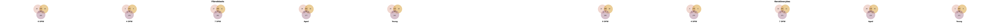

In [6]:
fontsize = 14
figscale = 7
leg_bbox = (0.5, 0.5)
y_offset = 0.03
colors = ['#E5B2A5', '#D99E32', '#B1849B']

# Fig grid
colors = np.hstack(((np.array(sns.color_palette(colors))), np.repeat(0.5, 3).reshape(-1,1))).astype(float)
fig = plt.figure(figsize=(14 * 5/2.54 * figscale, 6.262 * 0.2/2.54 * figscale))

gs_main = gridspec.GridSpec(1, 2, figure=fig, wspace=0.3)
ax_main = [fig.add_subplot(gs_main[i//2, i%2]) for i in range(2)]

for axs in ax_main:
    plt.setp(axs.spines.values(), visible=False)
    axs.tick_params(left=False, labelleft=False)
    axs.xaxis.set_visible(False)
    axs.patch.set_visible(False)


# Subfug grids
gs_0 = gridspec.GridSpecFromSubplotSpec(1, 5, ax_main[0], wspace=0.1)
ax_0 = [fig.add_subplot(gs_0[i//5, i%5]) for i in range(5)]

gs_1 = gridspec.GridSpecFromSubplotSpec(1, 5, ax_main[1], wspace=0.1)
ax_1 = [fig.add_subplot(gs_1[i//5, i%5]) for i in range(5)]


ax = ax_0 + ax_1

for axs in ax:
    plt.setp(axs.spines.values(), visible=False)
    axs.tick_params(left=False, labelleft=False)
    axs.xaxis.set_visible(False)
    axs.patch.set_visible(False)


# Fibroblasts

## 0DPW
ax[0].set_aspect('equal')
labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['0DPW']), set(robustness_dict['Fibroblast']['Intercept']['0DPW']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['0DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[0], fig=fig, leg=False, colors=colors)
ax[0].legend([], [], frameon=False)
ax[0].set_title('0 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)

## 4DPW
ax[1].set_aspect('equal')
labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['4DPW']), set(robustness_dict['Fibroblast']['Intercept']['4DPW']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['4DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[1], fig=fig, leg=False, colors=colors)
ax[1].legend([], [], frameon=False)
ax[1].set_title('4 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)

## 7DPW
ax[2].set_aspect('equal')
labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['7DPW']), set(robustness_dict['Fibroblast']['Intercept']['7DPW']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['7DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[2], fig=fig, leg=False, colors=colors)
ax[2].legend([], [], frameon=False)
ax[2].set_title('7 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)

## Aged
ax[3].set_aspect('equal')
labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['Aged']), set(robustness_dict['Fibroblast']['Intercept']['Aged']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['Aged'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[3], fig=fig, leg=False, colors=colors)
ax[3].legend([], [], frameon=False)
ax[3].set_title('Aged', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)

## Young
ax[4].set_aspect('equal')
labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['Young']), set(robustness_dict['Fibroblast']['Intercept']['Young']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['Young'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[4], fig=fig, leg=False, colors=colors)
ax[4].legend([], [], frameon=False)
ax[4].set_title('Young', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)


# Keratinocytes

## 0DPW
ax[5].set_aspect('equal')
labels = get_labels([set(robustness_dict['Keratinocyte']['Standard']['0DPW']), set(robustness_dict['Keratinocyte']['Intercept']['0DPW']), set(robustness_dict['Keratinocyte']['Intercept + Conditional Sparsity']['0DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[5], fig=fig, leg=False, colors=colors)
ax[5].legend([], [], frameon=False)
ax[5].set_title('0 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)


## 4DPW
ax[6].set_aspect('equal')
labels = get_labels([set(robustness_dict['Keratinocyte']['Standard']['4DPW']), set(robustness_dict['Keratinocyte']['Intercept']['4DPW']), set(robustness_dict['Keratinocyte']['Intercept + Conditional Sparsity']['4DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[6], fig=fig, leg=False, colors=colors)
ax[6].legend([], [], frameon=False)
ax[6].set_title('4 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)


## 7DPW
ax[7].set_aspect('equal')
labels = get_labels([set(robustness_dict['Keratinocyte']['Standard']['7DPW']), set(robustness_dict['Keratinocyte']['Intercept']['7DPW']), set(robustness_dict['Keratinocyte']['Intercept + Conditional Sparsity']['7DPW'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[7], fig=fig, leg=False, colors=colors)
ax[7].legend([], [], frameon=False)
ax[7].set_title('7 DPW', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)


## Aged
ax[8].set_aspect('equal')
labels = get_labels([set(robustness_dict['Keratinocyte']['Standard']['Aged']), set(robustness_dict['Keratinocyte']['Intercept']['Aged']), set(robustness_dict['Keratinocyte']['Intercept + Conditional Sparsity']['Aged'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[8], fig=fig, leg=False, colors=colors)
ax[8].legend([], [], frameon=False)
ax[8].set_title('Aged', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)


## Young
ax[9].set_aspect('equal')
labels = get_labels([set(robustness_dict['Keratinocyte']['Standard']['Young']), set(robustness_dict['Keratinocyte']['Intercept']['Young']), set(robustness_dict['Keratinocyte']['Intercept + Conditional Sparsity']['Young'])])
venn3(labels, names=['Standard', 'Intercept', 'Intercept + Conditional Sparsity'], ax=ax[9], fig=fig, leg=False, colors=colors)
ax[9].legend([], [], frameon=False)
ax[9].set_title('Young', fontsize=fontsize*1.3, weight='bold', pad=0, y=-0.1)

ax_main[0].set_title('Fibroblasts', fontsize=fontsize*1.55, weight='bold', pad=0)
ax_main[1].set_title('Keratinocytes', fontsize=fontsize*1.55, weight='bold', pad=0)


plt.savefig('plots/final/fig_6_venndiag.pdf', dpi=300, bbox_inches='tight')
plt.show()

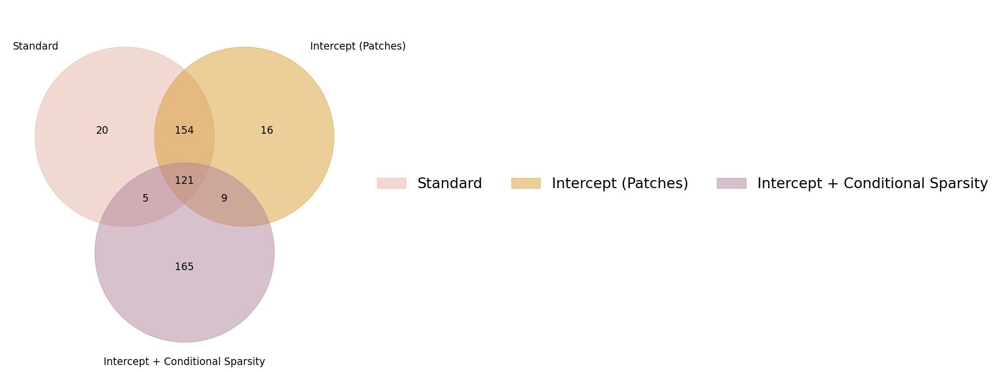

In [7]:
# Legend

plt.rc('legend',fontsize=20)

## Credits: https://stackoverflow.com/questions/4534480/get-legend-as-a-separate-picture-in-matplotlib
def export_legend(legend, filename="plots/final/fig_6_legend.png", expand=[-5,-5,5,5]):
    fig  = legend.figure
    fig.canvas.draw()
    bbox  = legend.get_window_extent()
    bbox = bbox.from_extents(*(bbox.extents + np.array(expand)))
    bbox = bbox.transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(filename, dpi=300, bbox_inches=bbox)


colors = ['#E5B2A5', '#D99E32', '#B1849B']
colors = np.hstack(((np.array(sns.color_palette(colors))), np.repeat(0.5, 3).reshape(-1,1))).astype(float)

labels = get_labels([set(robustness_dict['Fibroblast']['Standard']['0DPW']), set(robustness_dict['Fibroblast']['Intercept']['0DPW']), set(robustness_dict['Fibroblast']['Intercept + Conditional Sparsity']['0DPW'])])
fig, ax, leg = venn3(labels, names=['Standard', 'Intercept (Patches)', 'Intercept + Conditional Sparsity'], colors=colors)

leg.get_frame().set_linewidth(0.0)


export_legend(leg)